<a href="https://colab.research.google.com/github/Nandhini0226/Statistical-Performance-Indicators-Forecasting-Machine-Learning-Time-Series-/blob/main/SPI_Analysis_in_Machine_Learning_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Statistical Performance Indicator Analysis in Machine Learning




In [20]:
# Data manipulation & analysis (DataFrame/Series structures)
import pandas as pd
#This is a mathematical library. Has a powerful N-dimensional array object, linear algebra, Fourier transform, etc.
import numpy as np
#The Simple Imputer class from sklearn.impute is a useful tool for handling missing values in datasets.
from sklearn.impute import SimpleImputer

#This library is used for visualization of data.
import matplotlib.pyplot as plt
#This library is used for statistical graphics. It builds on top of matplotlib and integrates closely with pandas DS
import seaborn as sns


In [21]:
#Suppresses all warnings in  script—regardless of the warning type or origin.
import warnings
warnings.filterwarnings("ignore")
warnings.filterwarnings("ignore",category = DeprecationWarning)



# **🔼 1. Uploading the Dataset File**

In [69]:
from google.colab import files
uploaded = files.upload()

Saving SPI_index_2018-22.csv to SPI_index_2018-22 (4).csv


In [70]:
# Show all rows and columns without truncation
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

df=pd.read_csv("SPI_index_2018-22.csv")


# 🧼 **2. Data Preprocessing - Data Cleaning**

📊 Dataset Overview

In [71]:
# Basic info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1088 entries, 0 to 1087
Data columns (total 79 columns):
 #   Column                                                                                                                                                                        Non-Null Count  Dtype  
---  ------                                                                                                                                                                        --------------  -----  
 0   country                                                                                                                                                                       1088 non-null   object 
 1   iso3c                                                                                                                                                                         1088 non-null   object 
 2   year                                                                        

In [25]:
# Shape of dataset
df.shape

(1088, 79)

In [66]:
#to inspect all column types at once.
df.dtypes

,0
Pillar 1 - Data Use - Score,float64
Pillar 2 - Data Services - Score,float64
Pillar 3 - Data Products - Score,float64
Pillar 4 - Data Sources - Score,float64
Pillar 5 - Data Infrastructure - Score,float64
SPI Overall Score,float64
Dimension 1.5: Data use by international organizations,float64
Dimension 2.1: Data Releases,float64
Dimension 2.2: Online access,float64
Dimension 2.4: Data services,float64


🧹 Null and Duplicate Check

In [72]:
# Total number of duplicate rows
duplicate_rows=df.duplicated().sum()
print("Total number of duplicate rows:", duplicate_rows)

Total number of duplicate rows: 0


In [73]:
#To compute the total number of missing values in the data frame.
print(df.isnull().sum())

country                                                                                                                                                                           0
iso3c                                                                                                                                                                             0
year                                                                                                                                                                              0
Pillar 1  - Data Use - Score                                                                                                                                                      0
Pillar 2 - Data Services - Score                                                                                                                                                184
Pillar 3 - Data Products - Score                                                                    

In [74]:
# Identify numerical columns for handling missing value
numerical_columns = df.select_dtypes(include=['number']).columns.drop('year')
print("Numeric columns (excluding 'year'):", numerical_columns)

Numeric columns (excluding 'year'): Index(['Pillar 1  - Data Use - Score', 'Pillar 2 - Data Services - Score',
       'Pillar 3 - Data Products - Score', 'Pillar 4 - Data Sources - Score',
       'Pillar 5 - Data Infrastructure - Score', 'SPI Overall Score',
       'Dimension 1.5: Data use by international organizations',
       'Dimension 2.1: Data Releases', 'Dimension 2.2: Online access',
       'Dimension 2.4: Data services', 'Dimension 3.1: Social Statistics',
       'Dimension 3.2: Economic Statistics',
       'Dimension 3.3: Environmental Statistics',
       'Dimension 3.4: Institutional Statistics', 'Dimension 4.1: Censuses',
       'Dimension 4.1: Surveys', 'Dimension 4.2: Administrative Data',
       'Dimension 4.3: Geospatial Data',
       'Dimension 5.1: Legislation and governance',
       'Dimension 5.2: Standards and Methods', 'Dimension 5.5: Finance',
       'Dimension 1.5: Data use by international organisations - Availability of Comparable Poverty headcount ratio at $2

In [75]:
#SimpleImputer is For handling the missing data in the predictive model dataset.It replaces the NaN values with a
# specified placeholder

imputer =SimpleImputer(missing_values=np.nan,strategy='most_frequent')

numerical_columns_df=pd.DataFrame(imputer.fit_transform(df[numerical_columns]),columns=numerical_columns)

numerical_columns_df

,Pillar 1 - Data Use - Score,Pillar 2 - Data Services - Score,Pillar 3 - Data Products - Score,Pillar 4 - Data Sources - Score,Pillar 5 - Data Infrastructure - Score,SPI Overall Score,Dimension 1.5: Data use by international organizations,Dimension 2.1: Data Releases,Dimension 2.2: Online access,Dimension 2.4: Data services,Dimension 3.1: Social Statistics,Dimension 3.2: Economic Statistics,Dimension 3.3: Environmental Statistics,Dimension 3.4: Institutional Statistics,Dimension 4.1: Censuses,Dimension 4.1: Surveys,Dimension 4.2: Administrative Data,Dimension 4.3: Geospatial Data,Dimension 5.1: Legislation and governance,Dimension 5.2: Standards and Methods,Dimension 5.5: Finance,Dimension 1.5: Data use by international organisations - Availability of Comparable Poverty headcount ratio at $2.15 a day,"Dimension 1.5: Data use by international organisations - Availability of Mortality rate, under-5 (per 1,000 live births) data meeting quality standards according to UN IGME",Dimension 1.5: Data use by international organisations - Quality of Debt service data according to World Bank,Dimension 1.5: Data use by international organisations - Safely Managed Drinking Water,Dimension 1.5: Data use by international organisations - Labor force participation rate by sex and age (%),Dimension 2.1: Data releases - SDDS/e-GDDS subscription,Dimension 2.2: Online access - Machine Readability Score,Dimension 2.2: Online access - Non-Proprietary format Score,Dimension 2.2: Online access - Download Options Score,Dimension 2.2: Online access - Metadata Available Score,Dimension 2.2: Online access - Terms of Use Score,Dimension 2.2: Online access - ODIN Open Data Openness score,Dimension 2.4: Data access services - NADA metadata,Dimension 3.1: SDG Goal 1 - GOAL 1: No Poverty,Dimension 3.2: SDG Goal 2 - GOAL 2: Zero Hunger,Dimension 3.3: SDG Goal 3 - GOAL 3: Good Health and Well-being,Dimension 3.4: SDG Goal 4 - GOAL 4: Quality Education,Dimension 3.5: SDG Goal 5 - GOAL 5: Gender Equality,Dimension 3.6: SDG Goal 6 - GOAL 6: Clean Water and Sanitation,Dimension 3.7: SDG Goal 7 - GOAL 7: Affordable and Clean Energy,Dimension 3.8: SDG Goal 8 - GOAL 8: Decent Work and Economic Growth,"Dimension 3.9: SDG Goal 9 - GOAL 9: Industry, Innovation and Infrastructure",Dimension 3.10: SDG Goal 10 - GOAL 10: Reduced Inequality,Dimension 3.11: SDG Goal 11 - GOAL 11: Sustainable Cities and Communities,Dimension 3.12: SDG Goal 12 - GOAL 12: Responsible Consumption and Production,Dimension 3.13: SDG Goal 13 - GOAL 13: Climate Action,Dimension 3.15: SDG Goal 15 - GOAL 15: Life on Land,Dimension 3.16: SDG Goal 16 - GOAL 16: Peace and Justice Strong Institutions,Dimension 3.17: SDG Goal 17 - GOAL 17: Partnerships to achieve the Goal,Dimension 4.1: censuses and surveys - Population & Housing census,Dimension 4.1: censuses and surveys - Agriculture census,Dimension 4.1: censuses and surveys - Business/establishment census,"Dimension 4.1: censuses and surveys - Household Survey on income, etc",Dimension 4.1: censuses and surveys - Agriculture survey,Dimension 4.1: censuses and surveys - Labor Force Survey,Dimension 4.1: censuses and surveys - Health/Demographic survey,Dimension 4.1: censuses and surveys - Business/establishment survey,Dimension 4.2: administrative data - CRVS (WDI),Dimension 4.3: geospatial data - Geospatial data available at 1st Admin Level,Dimension 5.1: Legislation and governance - Legislation Indicator based on PARIS21 indicators on SDG 17.18.2,Dimension 5.2: standards - System of national accounts in use,Dimension 5.2: standards - National Accounts base year,Dimension 5.2: standards - Classification of national industry,Dimension 5.2: standards - CPI base year,Dimension 5.2: standards - Classification of household consumption,Dimension 5.2: standards - Classification of status of employment,Dimension 5.2: standards - Central government accounting status,Dimension 5.2: standards - Compilation of government finance statistics,Dimension 5.2: standards - 

In [76]:
# Identify categorical columns and convert it into date frame
categorical_columns = df.select_dtypes(include=['object']).columns
categorical_columns_df=pd.DataFrame(df[categorical_columns],columns=categorical_columns)

print(categorical_columns_df.isnull().sum())

country    0
iso3c      0
income     0
region     0
dtype: int64


### **📦 Boxplot Check for Outliers**

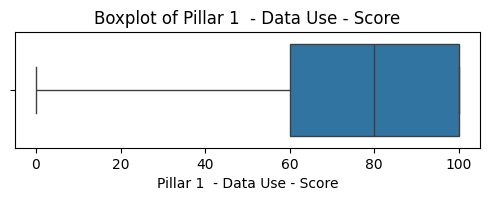

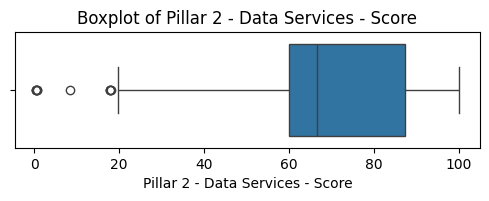

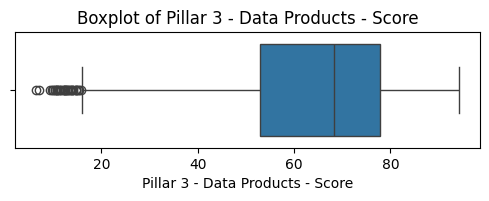

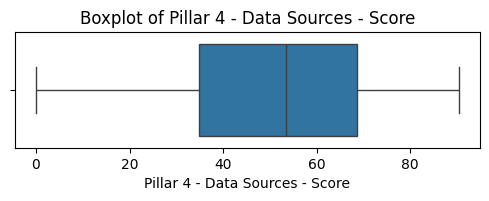

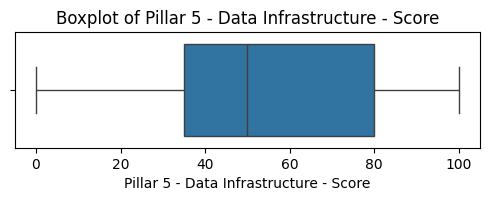

...

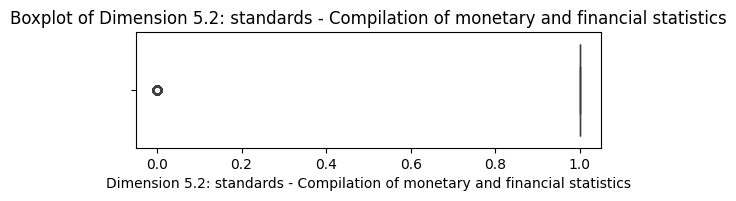

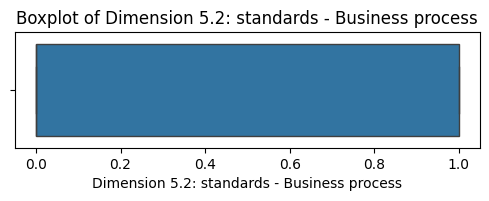

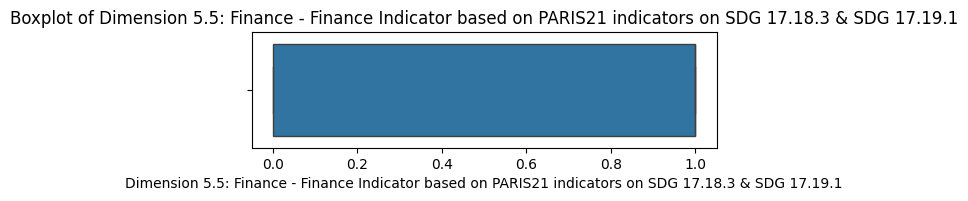

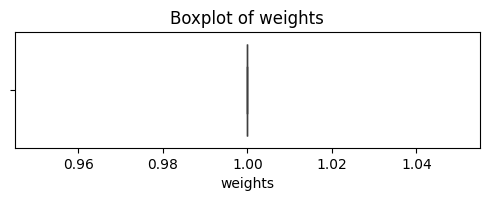

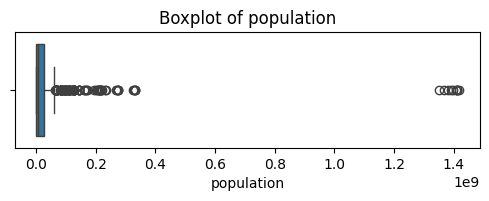

In [77]:
# Show boxplots for each numeric column
for col in numerical_columns:
    plt.figure(figsize=(6, 1.5))
    sns.boxplot(x=df[col])
    plt.title(f'Boxplot of {col}')
    plt.show()

🧮 Removing Outliers Using IQR Method

In [79]:
for col in numerical_columns:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    before = df.shape[0]
    df = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]
    after = df.shape[0]

    print(f"{col}: Removed {before - after} outliers")

Pillar 1  - Data Use - Score: Removed 0 outliers
Pillar 2 - Data Services - Score: Removed 194 outliers
Pillar 3 - Data Products - Score: Removed 11 outliers
Pillar 4 - Data Sources - Score: Removed 2 outliers
Pillar 5 - Data Infrastructure - Score: Removed 0 outliers
SPI Overall Score: Removed 0 outliers
Dimension 1.5: Data use by international organizations: Removed 21 outliers
Dimension 2.1: Data Releases: Removed 0 outliers
Dimension 2.2: Online access: Removed 0 outliers
Dimension 2.4: Data services: Removed 91 outliers
Dimension 3.1: Social Statistics: Removed 3 outliers
Dimension 3.2: Economic Statistics: Removed 0 outliers
Dimension 3.3: Environmental Statistics: Removed 0 outliers
Dimension 3.4: Institutional Statistics: Removed 0 outliers
Dimension 4.1: Censuses: Removed 18 outliers
Dimension 4.1: Surveys: Removed 0 outliers
Dimension 4.2: Administrative Data: Removed 0 outliers
Dimension 4.3: Geospatial Data: Removed 6 outliers
Dimension 5.1: Legislation and governance: Remo

📈 Boxplot After Outlier Removal

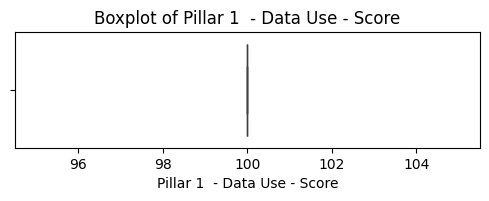

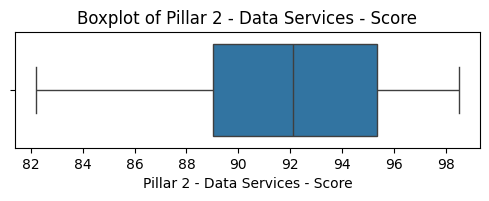

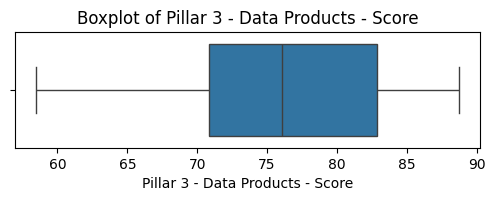

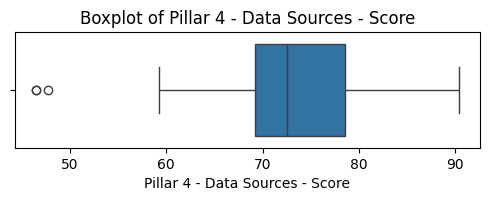

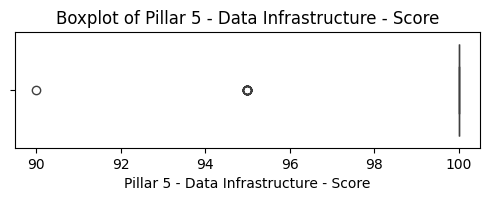

...

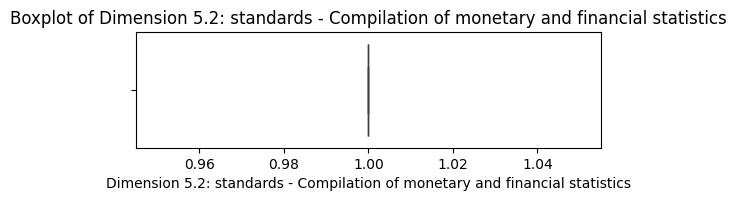

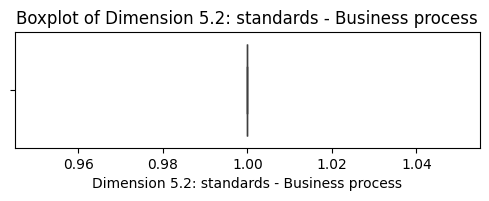

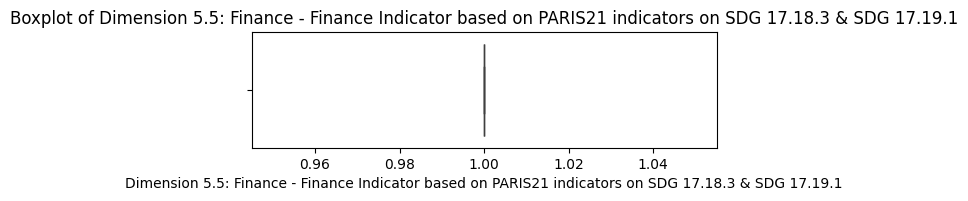

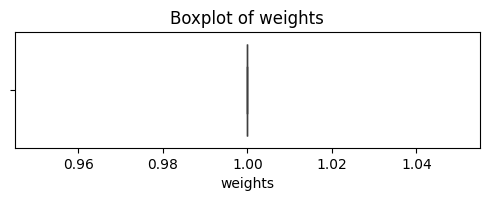

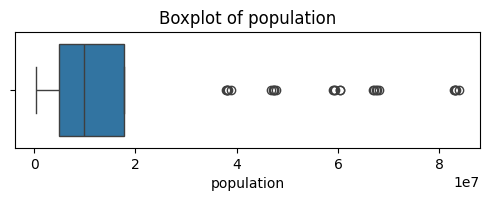

In [80]:
# Show boxplots for each numeric column

# Show boxplots for each numeric column
for col in numerical_columns:
  plt.figure(figsize=(6, 1.5))
  sns.boxplot(x=df[col])
  plt.title(f'Boxplot of {col}')
  plt.show()

Save Cleaned Data

In [106]:
#Merging Numerical Column Categorical Column and Year column after data pre processing

df = pd.concat([numerical_columns_df, categorical_columns_df, df[['year']]],axis=1)
df = df.dropna(subset=['year'])
df['year'] = df['year'].round().astype(int)
df.head()


,Pillar 1 - Data Use - Score,Pillar 2 - Data Services - Score,Pillar 3 - Data Products - Score,Pillar 4 - Data Sources - Score,Pillar 5 - Data Infrastructure - Score,SPI Overall Score,Dimension 1.5: Data use by international organizations,Dimension 2.1: Data Releases,Dimension 2.2: Online access,Dimension 2.4: Data services,Dimension 3.1: Social Statistics,Dimension 3.2: Economic Statistics,Dimension 3.3: Environmental Statistics,Dimension 3.4: Institutional Statistics,Dimension 4.1: Censuses,Dimension 4.1: Surveys,Dimension 4.2: Administrative Data,Dimension 4.3: Geospatial Data,Dimension 5.1: Legislation and governance,Dimension 5.2: Standards and Methods,Dimension 5.5: Finance,Dimension 1.5: Data use by international organisations - Availability of Comparable Poverty headcount ratio at $2.15 a day,"Dimension 1.5: Data use by international organisations - Availability of Mortality rate, under-5 (per 1,000 live births) data meeting quality standards according to UN IGME",Dimension 1.5: Data use by international organisations - Quality of Debt service data according to World Bank,Dimension 1.5: Data use by international organisations - Safely Managed Drinking Water,Dimension 1.5: Data use by international organisations - Labor force participation rate by sex and age (%),Dimension 2.1: Data releases - SDDS/e-GDDS subscription,Dimension 2.2: Online access - Machine Readability Score,Dimension 2.2: Online access - Non-Proprietary format Score,Dimension 2.2: Online access - Download Options Score,Dimension 2.2: Online access - Metadata Available Score,Dimension 2.2: Online access - Terms of Use Score,Dimension 2.2: Online access - ODIN Open Data Openness score,Dimension 2.4: Data access services - NADA metadata,Dimension 3.1: SDG Goal 1 - GOAL 1: No Poverty,Dimension 3.2: SDG Goal 2 - GOAL 2: Zero Hunger,Dimension 3.3: SDG Goal 3 - GOAL 3: Good Health and Well-being,Dimension 3.4: SDG Goal 4 - GOAL 4: Quality Education,Dimension 3.5: SDG Goal 5 - GOAL 5: Gender Equality,Dimension 3.6: SDG Goal 6 - GOAL 6: Clean Water and Sanitation,Dimension 3.7: SDG Goal 7 - GOAL 7: Affordable and Clean Energy,Dimension 3.8: SDG Goal 8 - GOAL 8: Decent Work and Economic Growth,"Dimension 3.9: SDG Goal 9 - GOAL 9: Industry, Innovation and Infrastructure",Dimension 3.10: SDG Goal 10 - GOAL 10: Reduced Inequality,Dimension 3.11: SDG Goal 11 - GOAL 11: Sustainable Cities and Communities,Dimension 3.12: SDG Goal 12 - GOAL 12: Responsible Consumption and Production,Dimension 3.13: SDG Goal 13 - GOAL 13: Climate Action,Dimension 3.15: SDG Goal 15 - GOAL 15: Life on Land,Dimension 3.16: SDG Goal 16 - GOAL 16: Peace and Justice Strong Institutions,Dimension 3.17: SDG Goal 17 - GOAL 17: Partnerships to achieve the Goal,Dimension 4.1: censuses and surveys - Population & Housing census,Dimension 4.1: censuses and surveys - Agriculture census,Dimension 4.1: censuses and surveys - Business/establishment census,"Dimension 4.1: censuses and surveys - Household Survey on income, etc",Dimension 4.1: censuses and surveys - Agriculture survey,Dimension 4.1: censuses and surveys - Labor Force Survey,Dimension 4.1: censuses and surveys - Health/Demographic survey,Dimension 4.1: censuses and surveys - Business/establishment survey,Dimension 4.2: administrative data - CRVS (WDI),Dimension 4.3: geospatial data - Geospatial data available at 1st Admin Level,Dimension 5.1: Legislation and governance - Legislation Indicator based on PARIS21 indicators on SDG 17.18.2,Dimension 5.2: standards - System of national accounts in use,Dimension 5.2: standards - National Accounts base year,Dimension 5.2: standards - Classification of national industry,Dimension 5.2: standards - CPI base year,Dimension 5.2: standards - Classification of household consumption,Dimension 5.2: standards - Classification of status of employment,Dimension 5.2: standards - Central government accounting status,Dimension 5.2: standards - Compilation of government finance statistics,Dimension 5.2: standards - 

In [108]:
# To check  the total number of missing values in the data frame after simple imputer.
print(df.isnull().sum())

Pillar 1  - Data Use - Score                                                                                                                                                    0
Pillar 2 - Data Services - Score                                                                                                                                                0
Pillar 3 - Data Products - Score                                                                                                                                                0
Pillar 4 - Data Sources - Score                                                                                                                                                 0
Pillar 5 - Data Infrastructure - Score                                                                                                                                          0
SPI Overall Score                                                                                             

### **📊 3. Dataset Overview**

Exploratory Data Analysis (EDA)

In [84]:

#Returns descriptive statistics about the data like mean, minimum, maximum, standard deviation, etc.
print("Descriptive Statistics of the Data Frame:","\n",df.describe())


Descriptive Statistics of the Data Frame: 
        Pillar 1  - Data Use - Score  Pillar 2 - Data Services - Score  \
count                   1088.000000                       1088.000000   
mean                      77.265074                         67.480882   
std                       22.620957                         19.001015   
min                        0.000000                          0.466667   
25%                       60.000000                         59.900000   
50%                       80.000000                         62.850000   
75%                      100.000000                         85.733333   
max                      100.000000                        100.000000   

       Pillar 3 - Data Products - Score  Pillar 4 - Data Sources - Score  \
count                       1088.000000                      1088.000000   
mean                          63.474069                        48.100506   
std                           19.756540                        19.9234

In [85]:
#info() is used to generate the summary of the Data Frame, this will include info about columns with their names,
#their datatypes, and missing values.
print("Generate the summary of the Data Frame:")
print(df.info())


Generate the summary of the Data Frame:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1088 entries, 0 to 1087
Data columns (total 79 columns):
 #   Column                                                                                                                                                                        Non-Null Count  Dtype  
---  ------                                                                                                                                                                        --------------  -----  
 0   Pillar 1  - Data Use - Score                                                                                                                                                  1088 non-null   float64
 1   Pillar 2 - Data Services - Score                                                                                                                                              1088 non-null   float64
 2   Pillar 3 - Data Products - Score    

In [86]:

#df.shape() display Total no of rows and columns data frame
print("Total no of rows and columns Data Frame:",df.shape)

Total no of rows and columns Data Frame: (1088, 79)


In [87]:

#Return the memory usage of each column in bytes.
print("Memory Usage of each column in bytes:","\n",df.memory_usage(index=True, deep=True))


Memory Usage of each column in bytes: 
 Index                                                                                                                                                                             132
Pillar 1  - Data Use - Score                                                                                                                                                     8704
Pillar 2 - Data Services - Score                                                                                                                                                 8704
Pillar 3 - Data Products - Score                                                                                                                                                 8704
Pillar 4 - Data Sources - Score                                                                                                                                                  8704
Pillar 5 - Data Infrastructure - Score            

## .**Data** **Visualization**

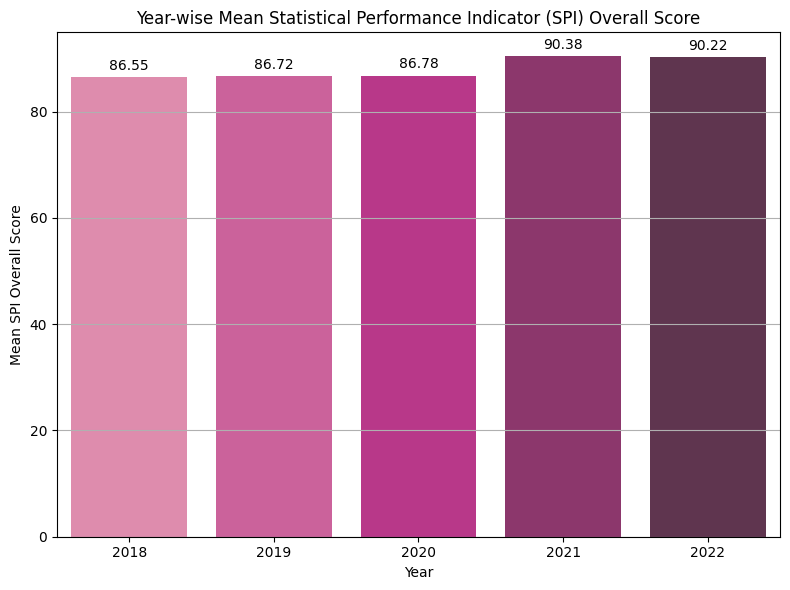

In [109]:

# To visualise the average Statistical performance Indicator Overall Score yearwise Bar graph is ploted
mean_scores = df.groupby('year')['SPI Overall Score'].mean().reset_index()
mean_scores['year'] = mean_scores['year'].astype(int).astype(str)

plt.figure(figsize=(8, 6))
ax= sns.barplot(x='year', y='SPI Overall Score', data=mean_scores, palette='RdPu_d'
                                                                           '')
# Labeling and aesthetics
for container in ax.containers:
    ax.bar_label(container, fmt='%.2f', padding=3)
plt.xlabel('Year')
plt.ylabel('Mean SPI Overall Score')
plt.title('Year-wise Mean Statistical Performance Indicator (SPI) Overall Score')
plt.grid(True, axis='y')
plt.tight_layout()
plt.show()



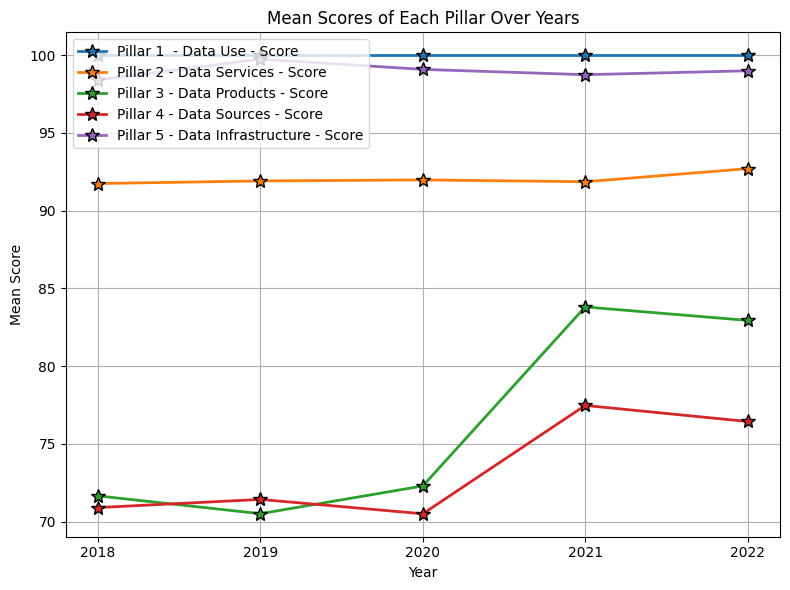

In [110]:
#To visualise the 5 pilliers score yearwise line graph is ploted
mean_scores = df.groupby('year')[['Pillar 1  - Data Use - Score',
                                  'Pillar 2 - Data Services - Score',
                                  'Pillar 3 - Data Products - Score',
                                  'Pillar 4 - Data Sources - Score',
                                  'Pillar 5 - Data Infrastructure - Score']].mean().reset_index()
years = mean_scores['year'].astype(str)
scores = mean_scores[['Pillar 1  - Data Use - Score',
                      'Pillar 2 - Data Services - Score',
                      'Pillar 3 - Data Products - Score',
                      'Pillar 4 - Data Sources - Score',
                      'Pillar 5 - Data Infrastructure - Score']].values

plt.figure(figsize=(8, 6))
colors = [ '#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']
pillars = ['Pillar 1  - Data Use - Score',
           'Pillar 2 - Data Services - Score',
           'Pillar 3 - Data Products - Score',
           'Pillar 4 - Data Sources - Score',
           'Pillar 5 - Data Infrastructure - Score']

for pillar, color in zip(pillars, colors):
    plt.plot(years, mean_scores[pillar], marker='*',ms=10,mec='black', label=pillar, color=color, linewidth=2)

# Labeling and aesthetics
plt.xlabel('Year')
plt.ylabel('Mean Score')
plt.title('Mean Scores of Each Pillar Over Years')
plt.xticks(years)
plt.legend(loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()



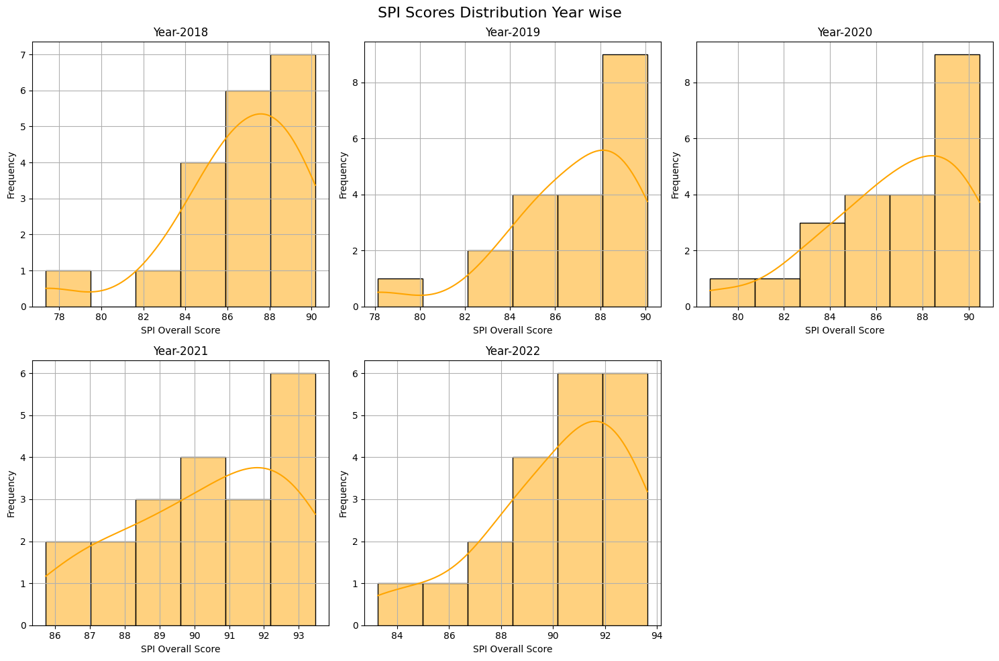

In [113]:
#To visualize the population year wise in histogram distribution plot and to check weather is normaly distributed

dfs = {year: data for year, data in df.groupby('year')}
years = sorted(df['year'].unique())
plt.figure(figsize=(15, 10))
plt.suptitle('SPI Scores Distribution Year wise', fontsize=16)
for i, year in enumerate(years):
    plt.subplot(2, 3, i + 1)  # Adjust the grid size as needed
    year_data = dfs[year]['SPI Overall Score']
    sns.histplot(year_data, kde=True, color="Orange")
    plt.title(f'Year-{year}')
    plt.ylabel('Frequency')
    plt.grid(True)

plt.tight_layout()
plt.show()

# ** Feature Engineering **

In [114]:
# Preprocessing library
from sklearn.preprocessing import StandardScaler, LabelEncoder

# Train-test split
from sklearn.model_selection import train_test_split

from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor

# Evaluation metrics
from sklearn.metrics import r2_score, mean_squared_error

In [115]:
#encoding categorical columns
le_income = LabelEncoder()
le_region = LabelEncoder()


df['income_encoded'] = le_income.fit_transform(df['income'])
df['region_encoded'] = le_region.fit_transform(df['region'])

# Check result
print(df[['income', 'income_encoded', 'region', 'region_encoded']].head())

# Categorical features (already encoded)
categorical_features = ["income_encoded", "region_encoded"]

        income  income_encoded                 region  region_encoded
0  High income               0  Europe & Central Asia               0
1  High income               0  Europe & Central Asia               0
2  High income               0          North America               2
3  High income               0  Europe & Central Asia               0
5  High income               0  Europe & Central Asia               0


In [116]:
# Pillar features
pillar_features = [
    "Pillar 1  - Data Use - Score",
    "Pillar 2 - Data Services - Score",
    "Pillar 3 - Data Products - Score",
    "Pillar 4 - Data Sources - Score",
    "Pillar 5 - Data Infrastructure - Score"
]

# Initialize scaler
scaler = StandardScaler()

# Fit and transform the pillar scores
df[pillar_features] = scaler.fit_transform(df[pillar_features])
df[pillar_features]

,Pillar 1 - Data Use - Score,Pillar 2 - Data Services - Score,Pillar 3 - Data Products - Score,Pillar 4 - Data Sources - Score,Pillar 5 - Data Infrastructure - Score
0,0.0,1.145530,1.547612,1.336998,0.468550
1,0.0,1.328281,1.390014,1.316817,0.468550
2,0.0,0.144753,0.942436,2.018679,0.468550
3,0.0,1.267364,1.456993,0.825737,0.468550
5,0.0,1.432710,1.369526,0.637378,0.468550
6,0.0,1.032399,1.288363,0.724830,0.468550
7,0.0,0.249182,1.575979,0.597015,0.468550
10,0.0,-0.255558,0.838421,1.316817,0.468550
11,0.0,0.736517,1.103186,1.135184,-1.897627
12,0.0,1.136828,1.378982,-0.058879,0.468550


In [117]:
# Combine for X
X = df[pillar_features + categorical_features]

# Target
y = df["SPI Overall Score"]

In [118]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [119]:
models = {
    "Linear Regression": LinearRegression(),
    "Decision Tree": DecisionTreeRegressor(random_state=42),
    "Random Forest": RandomForestRegressor(random_state=42),

}

In [120]:
# Dictionary to store results
results = {}

# Loop through models
for name, model in models.items():
    # Train the model
    model.fit(X_train, y_train)

    # Predict on train and test sets
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Calculate metrics
    r2_train = r2_score(y_train, y_train_pred)
    rmse_train = mean_squared_error(y_train, y_train_pred)

    r2_test = r2_score(y_test, y_test_pred)
    rmse_test = mean_squared_error(y_test, y_test_pred)

    # Store results
    results[name] = {
        "R²_Train": r2_train,
        "R²_Test": r2_test,
        "RMSE_Train": rmse_train,
        "RMSE_Test": rmse_test
    }

# Convert results to DataFrame
results_df = pd.DataFrame(results).T
results_df = results_df.sort_values(by="R²_Test", ascending=False)
print("Regression Model Performance:\n")
print(results_df)

Regression Model Performance:

                   R²_Train   R²_Test    RMSE_Train     RMSE_Test
Linear Regression  1.000000  1.000000  7.006666e-18  6.633752e-18
Random Forest      0.994355  0.932976  6.550162e-02  5.283458e-01
Decision Tree      1.000000  0.871803  0.000000e+00  1.010575e+00


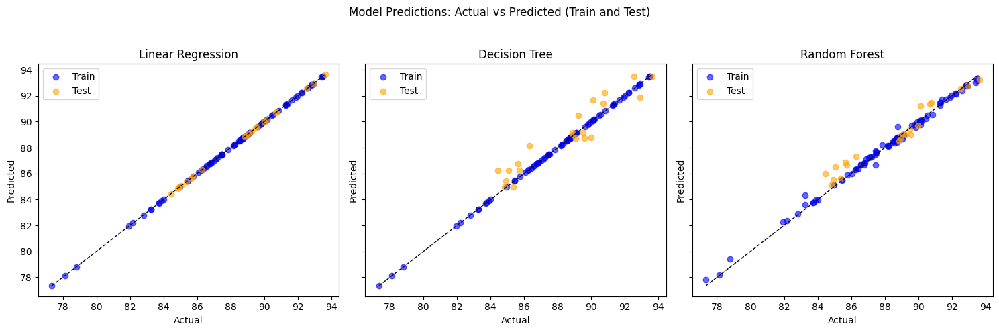

In [121]:

# Assume models dict, X_train, y_train, X_test, y_test are already defined
fig, axes = plt.subplots(1, len(models), figsize=(5 * len(models), 5), sharey=True)

for ax, (name, model) in zip(axes, models.items()):
    # Fit model
    model.fit(X_train, y_train)
    # Predict
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Scatter plots
    ax.scatter(y_train, y_train_pred, color='blue', alpha=0.6, label='Train')
    ax.scatter(y_test, y_test_pred, color='orange', alpha=0.6, label='Test')

    # 45-degree line for perfect predictions
    min_val = min(y_train.min(), y_test.min())
    max_val = max(y_train.max(), y_test.max())
    ax.plot([min_val, max_val], [min_val, max_val], 'k--', lw=1)

    ax.set_title(name)
    ax.set_xlabel('Actual')
    ax.set_ylabel('Predicted')
    ax.legend()

plt.suptitle('Model Predictions: Actual vs Predicted (Train and Test)')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()